In [1]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as image
import math
results_path = "/hpc/home/mk423/Anxiety/FullDataWork/Validations/"

plots_path = "/hpc/home/mk423/Anxiety/FullDataWork/Figures/"


def mean_sterr_auc_3n(auc_dict):
    temp = []
    temp_2 = []
    temp_3 = []
    n_samps = 0
    for i, key in enumerate(auc_dict.keys()):
        if ~np.isnan(auc_dict[key][0]):            
            temp.append(auc_dict[key][0])
            temp_2.append(auc_dict[key][1])
            temp_3.append(auc_dict[key][2])
            
    mean = np.mean(temp)
    stderr = np.std(temp) / np.sqrt(len(temp))
    
    mean_2 = np.mean(temp_2)
    stderr_2 = np.std(temp_2) / np.sqrt(len(temp_2))
    
    mean_3 = np.mean(temp_3)
    stderr_3 = np.std(temp_3) / np.sqrt(len(temp_3))
    
    return mean, stderr, mean_2, stderr_2, mean_3, stderr_3, len(temp)

def mean_sterr_auc(auc_dict):
    temp = []
    n_samps = 0
    for i, key in enumerate(auc_dict.keys()):
        if ~np.isnan(auc_dict[key][0]):            
            temp.append(auc_dict[key])
    mean = np.mean(temp)
    stderr = np.std(temp) / np.sqrt(len(temp))
    return mean, stderr, len(temp)

### Single Network Performance

Here we look at the performance of our traditional single network model after implementing the rebalancing of the NMF initialization. We observe that the model predicts comparably well, but the structure of our networks is much more variable than before.

In [2]:
results_file = results_path + "rebal_1_net_kf_fold_{}_results.pkl"
plots_file = plots_path + "rebal_1_net_{}_electome.png"

fold_list = [1,2,3,4]

flx_auc_list = []
epm_auc_list = []
oft_auc_list = []

flx_sterr_list = []
epm_sterr_list = []
oft_sterr_list = []

flx_points_list = []
epm_points_list = []
oft_points_list = []

for fold in fold_list:
    
    resultsDict = pickle.load(open(results_file.format(fold),"rb"))
    print(fold)
    
    flx_mean, flx_sterr, flx_n = mean_sterr_auc(resultsDict['flx_val_auc'])
    print("FLX",flx_mean, flx_sterr, flx_n)
    flx_auc_list.append(flx_mean)
    flx_sterr_list.append(flx_sterr)
    flx_points_list.append([resultsDict['flx_val_auc'][key] for key in resultsDict['flx_val_auc'].keys()])

    epm_mean, epm_sterr, epm_n = mean_sterr_auc(resultsDict['epm_val_auc'])
    print("EPM",epm_mean, epm_sterr, epm_n)
    epm_auc_list.append(epm_mean)
    epm_sterr_list.append(epm_sterr)
    epm_points_list.append([resultsDict['epm_val_auc'][key] for key in resultsDict['epm_val_auc'].keys()])
  
    oft_mean, oft_sterr, oft_n = mean_sterr_auc(resultsDict['oft_val_auc'])
    print("OFT",oft_mean, oft_sterr, oft_n)
    oft_auc_list.append(oft_mean)
    oft_sterr_list.append(oft_sterr)
    oft_points_list.append([resultsDict['oft_val_auc'][key] for key in resultsDict['oft_val_auc'].keys()])

    print(resultsDict["best_epoch"])

1
FLX 0.6770569311958509 0.07093795855933595 3
EPM 0.5497826872857131 0.03704444147902885 7
OFT 0.6866837421314417 0.07274071704409657 3
564
2
FLX 0.6300764068839724 0.06481164734998318 2
EPM 0.5345440542991824 0.026647013947510415 7
OFT 0.6838580720012228 0.07380140110469227 2
1792
3
FLX 0.5245329626480624 0.003154297205619932 2
EPM 0.5426230778434431 0.012772981744157513 6
OFT 0.5758521984027574 0.019119835448039076 4
487
4
FLX 0.6102736167486817 0.0035189997711032946 2
EPM 0.570039098853745 0.02753065216812229 6
OFT 0.6143499989225775 0.02517400506689236 3
682


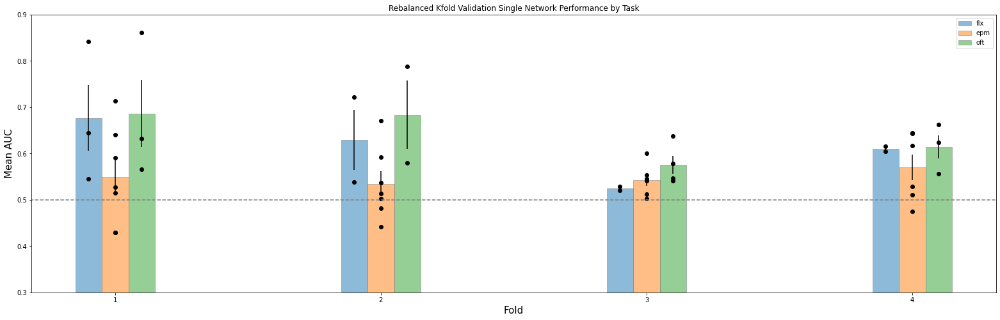

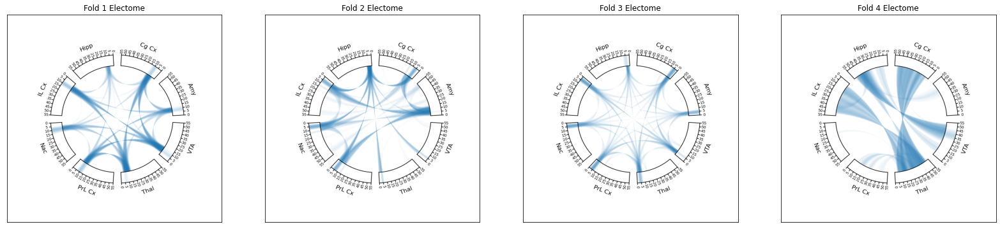

In [3]:
barWidth = 0.1
fig = plt.subplots(figsize=(27,8))

br1 = np.arange(len(flx_auc_list))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]

# Make the plot
plt.bar(br1, flx_auc_list,yerr=flx_sterr_list, width = barWidth,
        edgecolor ='grey', label ='flx',alpha=0.5)
plt.bar(br2, epm_auc_list,yerr=epm_sterr_list, width = barWidth,
        edgecolor ='grey', label ='epm',alpha=0.5)
plt.bar(br3, oft_auc_list,yerr=oft_sterr_list, width = barWidth,
        edgecolor ='grey', label ='oft',alpha=0.5)

for fold in range(len(fold_list)):
    plt.scatter(np.ones(len(flx_points_list[fold]))*br1[fold],flx_points_list[fold],color="black")
    plt.scatter(np.ones(len(epm_points_list[fold]))*br2[fold],epm_points_list[fold],color="black")
    plt.scatter(np.ones(len(oft_points_list[fold]))*br3[fold],oft_points_list[fold],color="black")

# Adding Xticks
plt.axhline(0.5,-1,6,linestyle="dashed",color="grey")
plt.xlabel('Fold', fontsize = 15)
plt.ylabel('Mean AUC', fontsize = 15)
plt.xticks([r + barWidth for r in range(len(flx_auc_list))],
        fold_list)
plt.ylim([0.3,.9])
plt.legend()
plt.title("Rebalanced Kfold Validation Single Network Performance by Task")
plt.show()

plt.figure(figsize=(35,6))

for i in fold_list:
    plt.subplot(1,5,i)
    im = image.imread(plots_file.format(i))
    plt.imshow(im,aspect="auto")
    plt.title("Fold {} Electome".format(i))
    plt.xticks([])
    plt.yticks([])
plt.show()

## 3 Network Performance

Here we consider the performance of 3 separate networks each trained to predict for the same task. Each of the 3 networks are initialized with a different network from the unsupervised NMF model that has been adjusted to rebalance the training data. Once again we find similar predictive performance to when we trained on all of the data for pretraining, but we've lost network consistency that we were seeing earlier.

In [32]:
results_file = results_path + "rebal_3_net_{}_results.pkl"
plots_file = plots_path + "bal_3_network_net_{}_30_component_kf_fold_{}_electome.png"

fold_list = [1,2,3,4]
flx_auc_list = []
epm_auc_list = []
oft_auc_list = []

flx_sterr_list = []
epm_sterr_list = []
oft_sterr_list = []

flx_points_list = []
epm_points_list = []
oft_points_list = []

flx_auc_list_2 = []
epm_auc_list_2 = []
oft_auc_list_2 = []

flx_sterr_list_2 = []
epm_sterr_list_2 = []
oft_sterr_list_2 = []

flx_points_list_2 = []
epm_points_list_2 = []
oft_points_list_2 = []

flx_auc_list_3 = []
epm_auc_list_3 = []
oft_auc_list_3 = []

flx_sterr_list_3 = []
epm_sterr_list_3 = []
oft_sterr_list_3 = []

flx_points_list_3 = []
epm_points_list_3 = []
oft_points_list_3 = []

net_1_list = []
net_2_list = []
net_3_list = []
for fold in fold_list:
    
    resultsDict = pickle.load(open(results_file.format(fold),"rb"))
    print(fold)
    
    flx_mean, flx_sterr, flx_mean_2, flx_sterr_2, flx_mean_3, flx_sterr_3, flx_n = mean_sterr_auc_3n(resultsDict['flx_val_auc'])
    print("\nFLX_1",flx_mean, flx_sterr, flx_n)
    print("FLX_2",flx_mean_2, flx_sterr_2, flx_n)
    #print(resultsDict['flx_val_auc'].keys())
    #print(resultsDict['flx_train_auc'].keys())

    flx_auc_list.append(flx_mean)
    flx_sterr_list.append(flx_sterr)
    flx_points_list.append([resultsDict['flx_val_auc'][key][0] for key in resultsDict['flx_val_auc'].keys()])
    flx_auc_list_2.append(flx_mean_2)
    flx_sterr_list_2.append(flx_sterr_2)
    flx_points_list_2.append([resultsDict['flx_val_auc'][key][1] for key in resultsDict['flx_val_auc'].keys()])
    flx_auc_list_3.append(flx_mean_3)
    flx_sterr_list_3.append(flx_sterr_3)
    flx_points_list_3.append([resultsDict['flx_val_auc'][key][2] for key in resultsDict['flx_val_auc'].keys()])

    
    epm_mean, epm_sterr, epm_mean_2, epm_sterr_2, epm_mean_3, epm_sterr_3, epm_n = mean_sterr_auc_3n(resultsDict['epm_val_auc'])
    print("\nEPM_1",epm_mean, epm_sterr, epm_n)
    print("EPM_2",epm_mean_2, epm_sterr_2, epm_n)
    #print(resultsDict['epm_val_auc'].keys())
    #print(resultsDict['epm_train_auc'].keys())

    epm_auc_list.append(epm_mean)
    epm_sterr_list.append(epm_sterr)
    epm_points_list.append([resultsDict['epm_val_auc'][key][0] for key in resultsDict['epm_val_auc'].keys()])

    epm_auc_list_2.append(epm_mean_2)
    epm_sterr_list_2.append(epm_sterr_2)
    epm_points_list_2.append([resultsDict['epm_val_auc'][key][1] for key in resultsDict['epm_val_auc'].keys()])

    epm_auc_list_3.append(epm_mean_3)
    epm_sterr_list_3.append(epm_sterr_3)
    epm_points_list_3.append([resultsDict['epm_val_auc'][key][2] for key in resultsDict['epm_val_auc'].keys()])
    
    oft_mean, oft_sterr, oft_mean_2, oft_sterr_2, oft_mean_3, oft_sterr_3, oft_n = mean_sterr_auc_3n(resultsDict['oft_val_auc'])
    print("\nOFT_1",oft_mean, oft_sterr, oft_n)
    print("OFT_2",oft_mean_2, oft_sterr_2, oft_n)
    #print(resultsDict['oft_val_auc'].keys())
    #print(resultsDict['oft_train_auc'].keys())

    oft_auc_list.append(oft_mean)
    oft_sterr_list.append(oft_sterr)
    oft_points_list.append([resultsDict['oft_val_auc'][key][0] for key in resultsDict['oft_val_auc'].keys()])

    oft_auc_list_2.append(oft_mean_2)
    oft_sterr_list_2.append(oft_sterr_2)
    oft_points_list_2.append([resultsDict['oft_val_auc'][key][1] for key in resultsDict['oft_val_auc'].keys()])
    
    oft_auc_list_3.append(oft_mean_3)
    oft_sterr_list_3.append(oft_sterr_3)
    oft_points_list_3.append([resultsDict['oft_val_auc'][key][2] for key in resultsDict['oft_val_auc'].keys()])

    net_1_list.append(resultsDict['recon_cont_net_1'])
    net_2_list.append(resultsDict['recon_cont_net_2'])
    net_3_list.append(resultsDict['recon_cont_net_3'])
    print(resultsDict["best_epoch"])

1

FLX_1 0.6294067731893705 0.07139724415818104 3
FLX_2 0.5755915232634972 0.03707614949846887 3

EPM_1 0.5617719921168353 0.0198812810404494 7
EPM_2 0.42506921572980605 0.046552719455457185 7

OFT_1 0.5403527626040582 0.03195185281782843 3
OFT_2 0.6132046538922649 0.05026504667165712 3
1980
2

FLX_1 0.661659027980612 0.11562328710397822 2
FLX_2 0.5503966429295153 0.036005942067260294 2

EPM_1 0.5602805019458574 0.028063503692225728 7
EPM_2 0.5601203057713704 0.012661270223810448 7

OFT_1 0.7035036998784137 0.053682105929845035 2
OFT_2 0.5140863493280883 0.018002731120119145 2
1486
3

FLX_1 0.5517883289091339 0.032674814569417454 2
FLX_2 0.5190670928255166 0.0019932367436519063 2

EPM_1 0.558593832286694 0.013962035314701634 6
EPM_2 0.5430245920248773 0.010478042851531004 6

OFT_1 0.5232176579415095 0.034754553495342455 4
OFT_2 0.513082741953413 0.013426642263602144 4
1684
4

FLX_1 0.5648550945102815 0.003752192495897637 2
FLX_2 0.6152043001185515 0.015551572789873638 2

EPM_1 0.565078

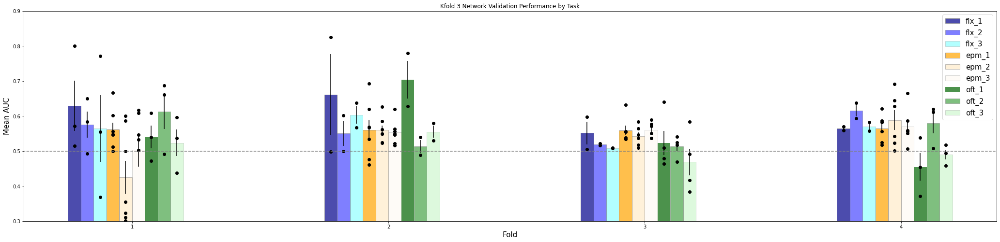

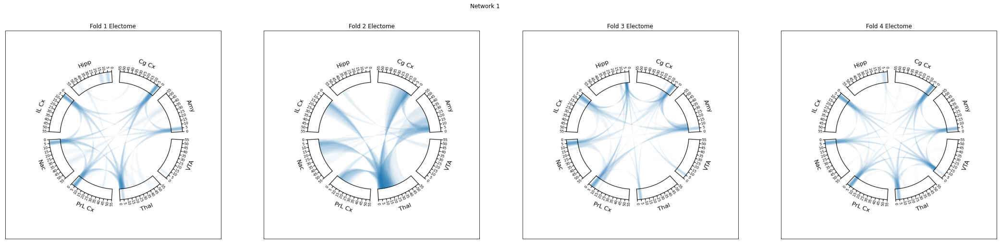

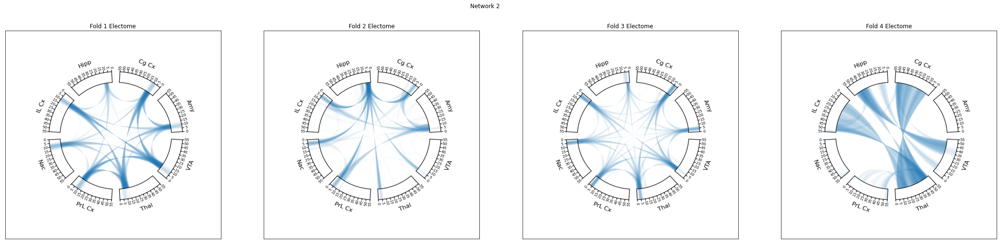

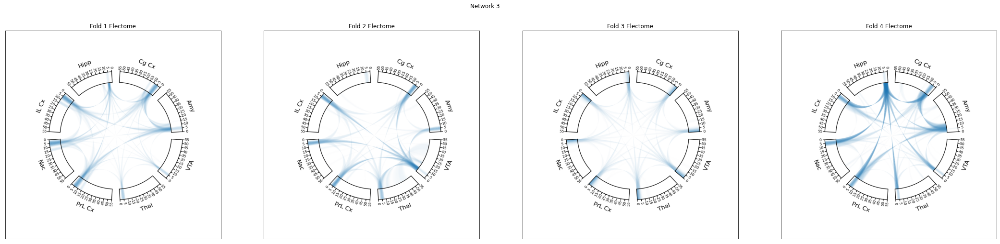

In [33]:
barWidth = 0.05
fig = plt.subplots(figsize=(36,8))

br1 = np.arange(len(flx_auc_list))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]
br4 = [x + barWidth for x in br3]
br5 = [x + barWidth for x in br4]
br6 = [x + barWidth for x in br5]
br7 = [x + barWidth for x in br6]
br8 = [x + barWidth for x in br7]
br9 = [x + barWidth for x in br8]
# Make the plot
plt.bar(br1, flx_auc_list,yerr=flx_sterr_list, width = barWidth,
        color="darkblue",edgecolor ='grey', label ='flx_1',alpha=0.7)
plt.bar(br2, flx_auc_list_2,yerr=flx_sterr_list_2, width = barWidth,
        color="blue",edgecolor ='grey', label ='flx_2',alpha=0.5)
plt.bar(br3, flx_auc_list_3,yerr=flx_sterr_list_3, width = barWidth,
        color="cyan",edgecolor ='grey', label ='flx_3',alpha=0.3)

plt.bar(br4, epm_auc_list,yerr=epm_sterr_list, width = barWidth,
        color ='orange',edgecolor ='grey', label ='epm_1',alpha=0.7)
plt.bar(br5, epm_auc_list_2,yerr=epm_sterr_list_2, width = barWidth,
        color ='moccasin',edgecolor ='grey', label ='epm_2',alpha=0.5)
plt.bar(br6, epm_auc_list_3,yerr=epm_sterr_list_3, width = barWidth,
        color ='oldlace',edgecolor ='grey', label ='epm_3',alpha=0.3)

plt.bar(br7, oft_auc_list,yerr=oft_sterr_list, width = barWidth,
        color ='darkgreen', label ='oft_1',alpha=0.7)
plt.bar(br8, oft_auc_list_2,yerr=oft_sterr_list_2, width = barWidth,
        color ='green',edgecolor ='grey', label ='oft_2',alpha=0.5)
plt.bar(br9, oft_auc_list_3,yerr=oft_sterr_list_3, width = barWidth,
        color ='lightgreen',edgecolor ='grey', label ='oft_3',alpha=0.3)

for fold in range(len(fold_list)):
    plt.scatter(np.ones(len(flx_points_list[fold]))*br1[fold],flx_points_list[fold],color="black")
    plt.scatter(np.ones(len(flx_points_list_2[fold]))*br2[fold],flx_points_list_2[fold],color="black")
    plt.scatter(np.ones(len(flx_points_list_3[fold]))*br3[fold],flx_points_list_3[fold],color="black")

    plt.scatter(np.ones(len(epm_points_list[fold]))*br4[fold],epm_points_list[fold],color="black")
    plt.scatter(np.ones(len(epm_points_list_2[fold]))*br5[fold],epm_points_list_2[fold],color="black")
    plt.scatter(np.ones(len(epm_points_list_3[fold]))*br6[fold],epm_points_list_3[fold],color="black")

    plt.scatter(np.ones(len(oft_points_list[fold]))*br7[fold],oft_points_list[fold],color="black")
    plt.scatter(np.ones(len(oft_points_list_2[fold]))*br8[fold],oft_points_list_2[fold],color="black")
    plt.scatter(np.ones(len(oft_points_list_3[fold]))*br9[fold],oft_points_list_3[fold],color="black")

    
plt.axhline(0.5,-1,6,linestyle="dashed",color="grey")
# Adding Xticks
plt.xlabel('Fold', fontsize = 15)
plt.ylabel('Mean AUC', fontsize = 15)
plt.xticks([r + 4.5*barWidth for r in range(len(flx_auc_list))],
        fold_list)

plt.legend(prop={'size':15})
plt.ylim([0.3,.9])
plt.title("Kfold 3 Network Validation Performance by Task")
plt.show()


for net in [1,2,3]:
    plt.figure(figsize=(37,8))
    
    for i,fold in enumerate(fold_list):
        plt.subplot(1,4,i+1)
        im = image.imread(plots_file.format(net,fold))
        plt.imshow(im,aspect="auto")
        plt.title("Fold {} Electome".format(fold))
        plt.xticks([])
        plt.yticks([])
    plt.suptitle("Network {}".format(net))
    plt.show()

## Network Matching for 3 Networks

Here we use the Hungarian algorithm to match the msot similar networks to each other. The algorithm doesn't support finding the most similar combination between more than 2 groups, so we use a fold as a reference fold and find the most similar network from the concatenation of all other folds

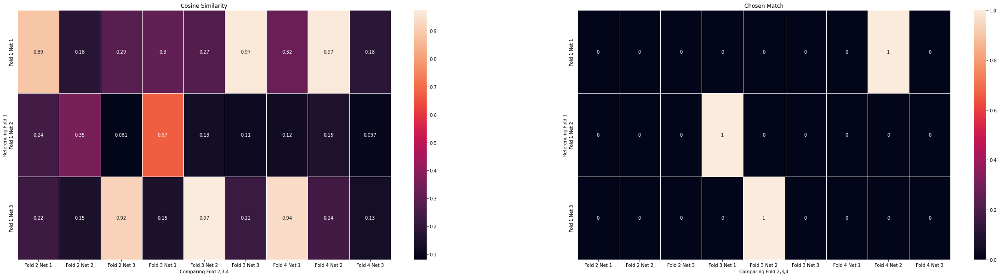

best match: 0<->7


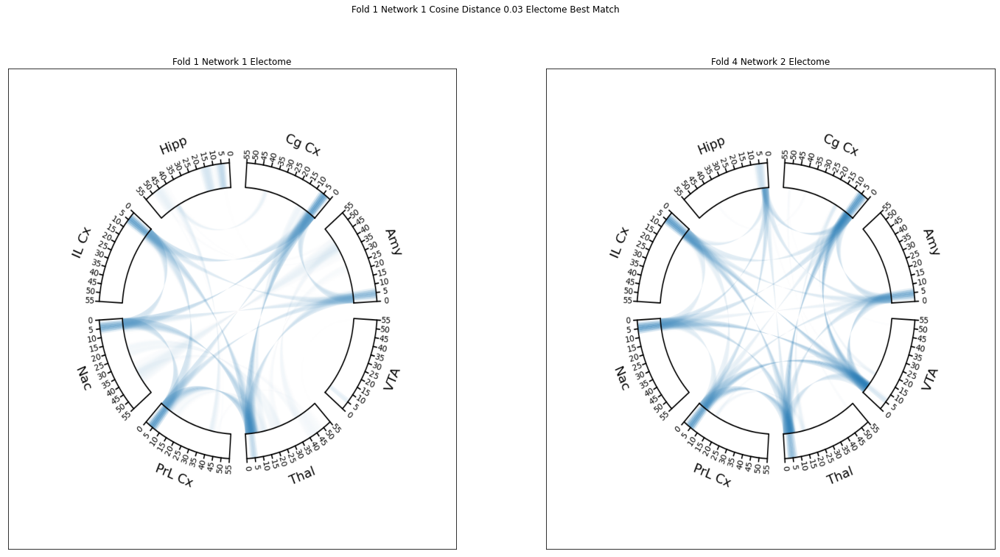

best match: 1<->3


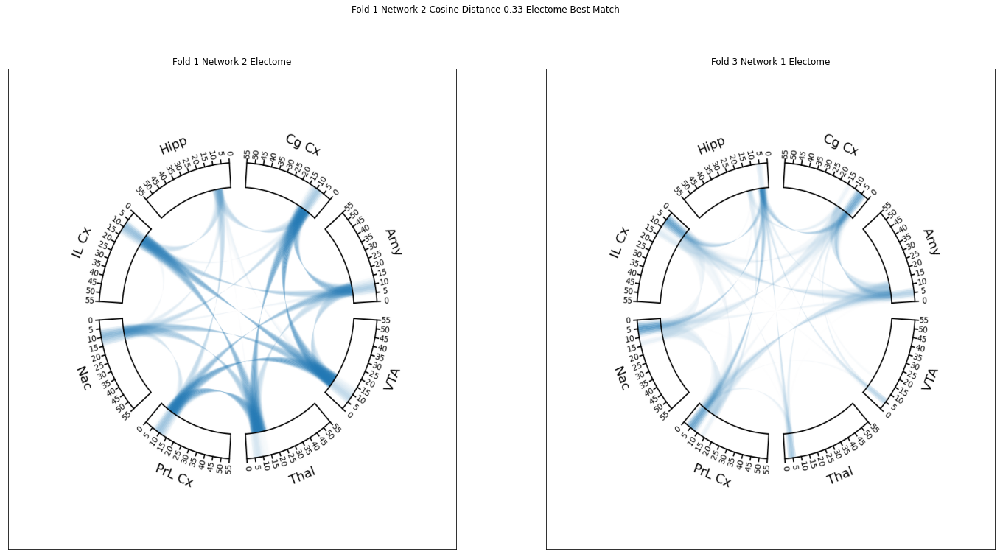

best match: 2<->4


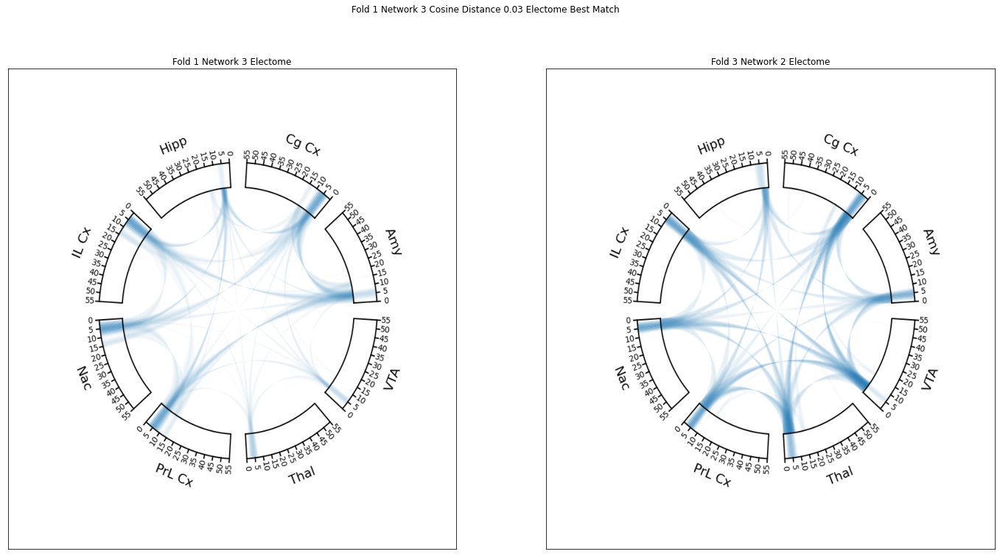

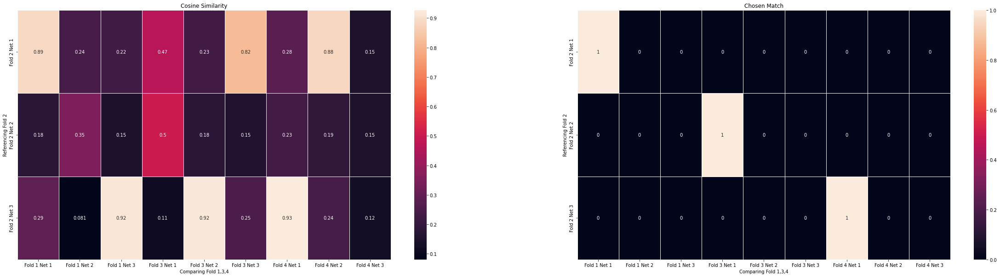

best match: 0<->0


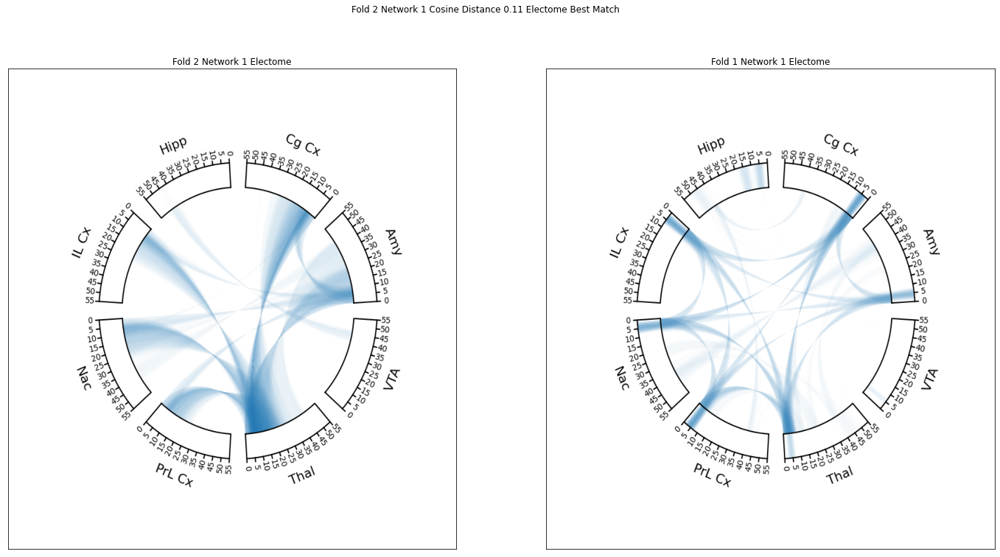

best match: 1<->3


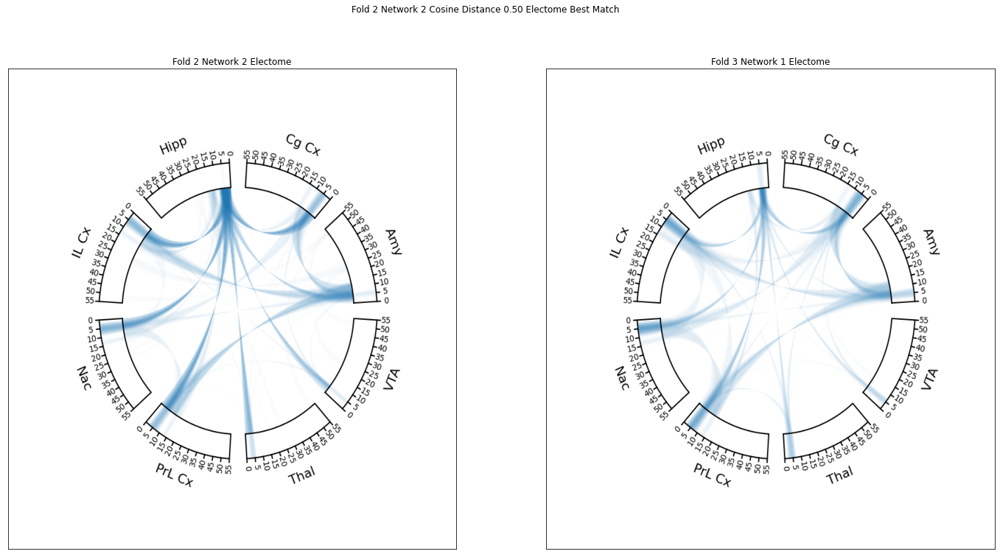

best match: 2<->6


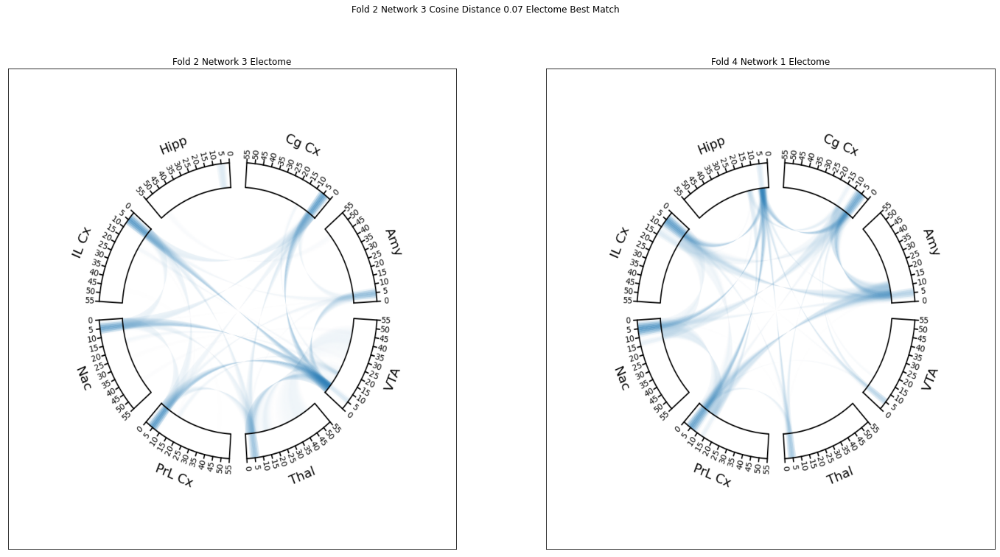

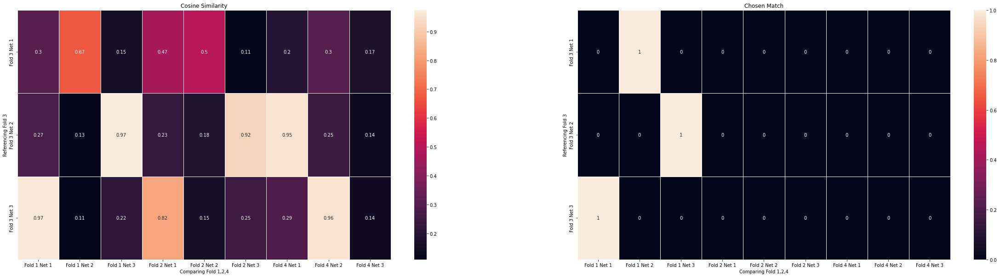

best match: 0<->1


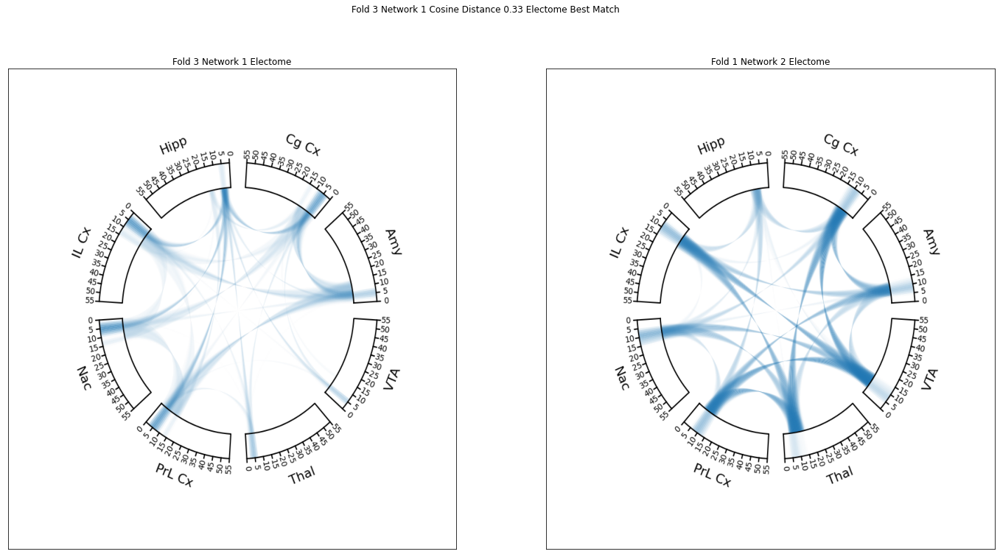

best match: 1<->2


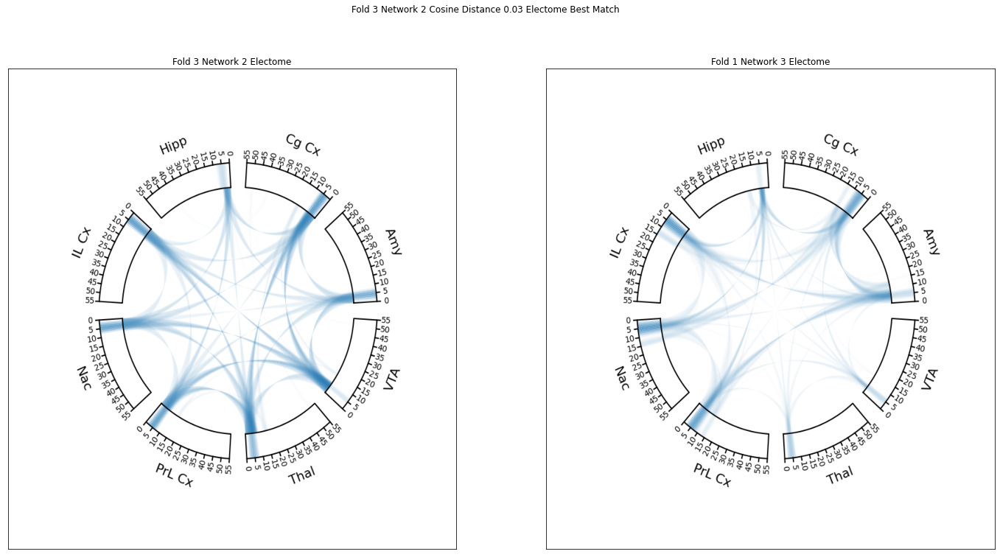

best match: 2<->0


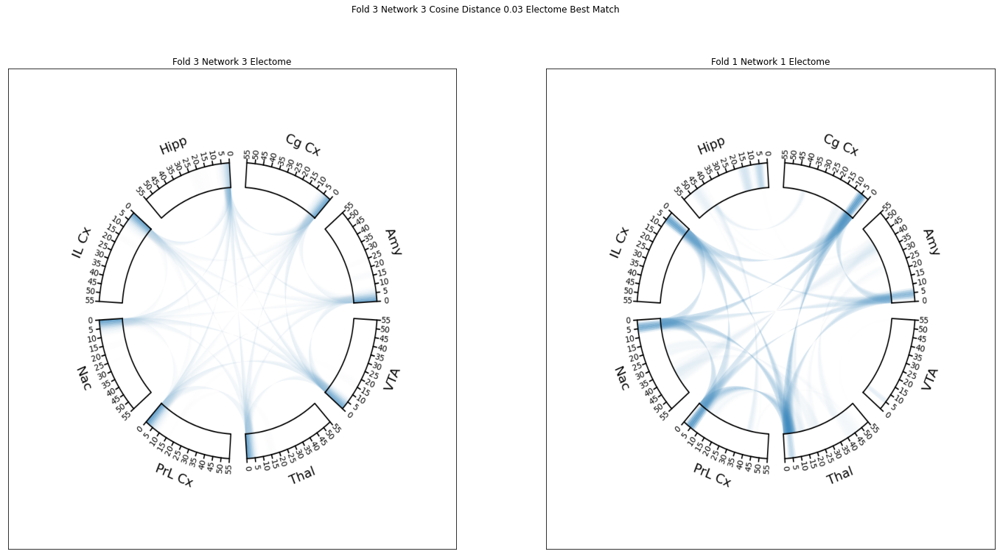

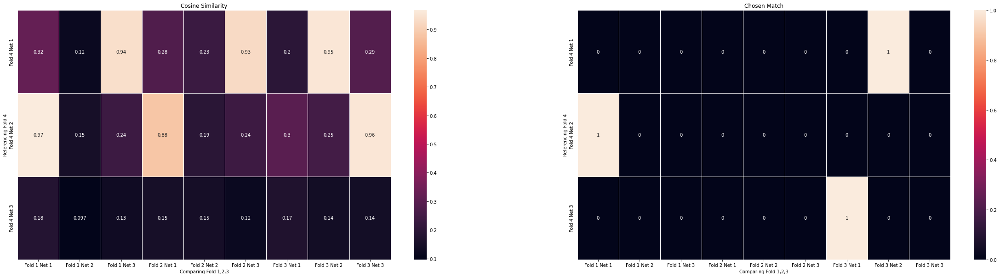

best match: 0<->7


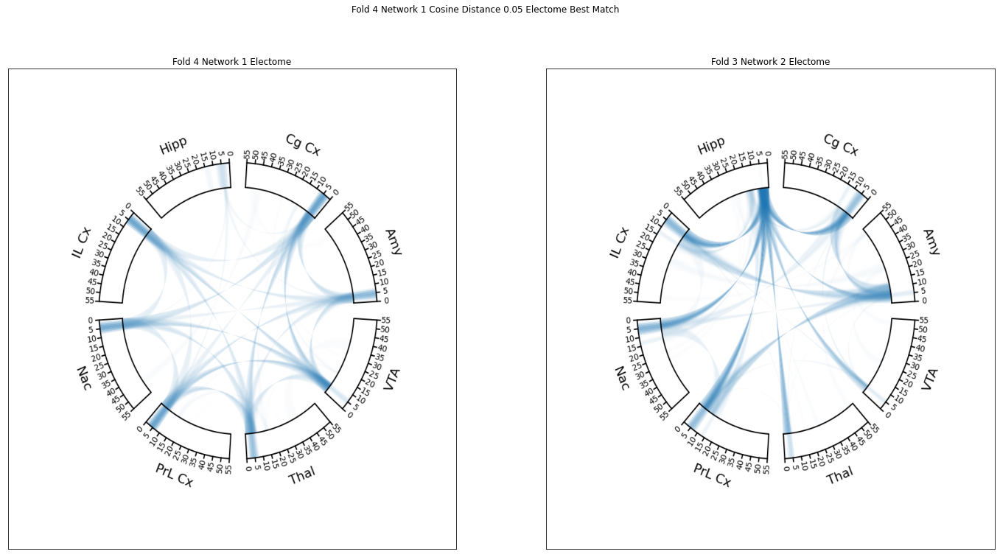

best match: 1<->0


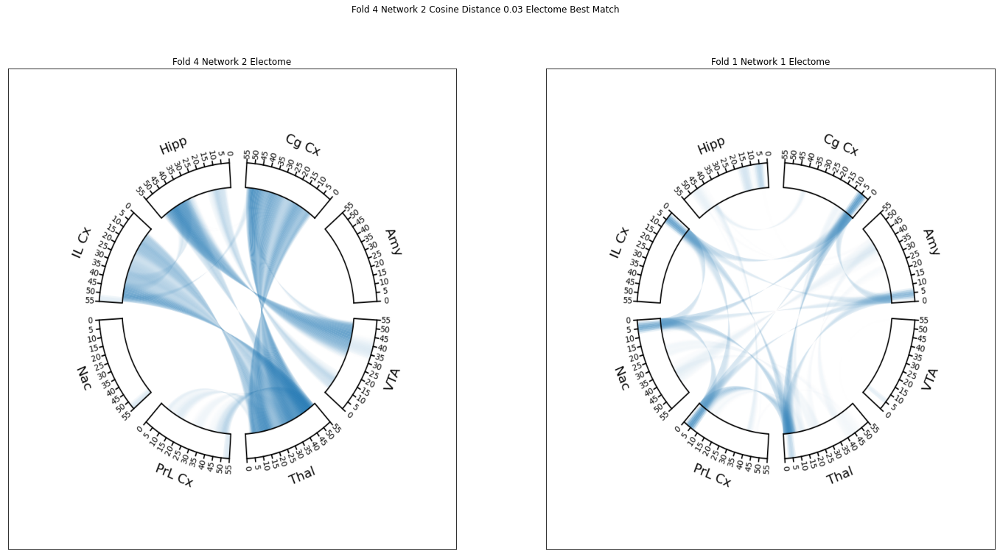

best match: 2<->6


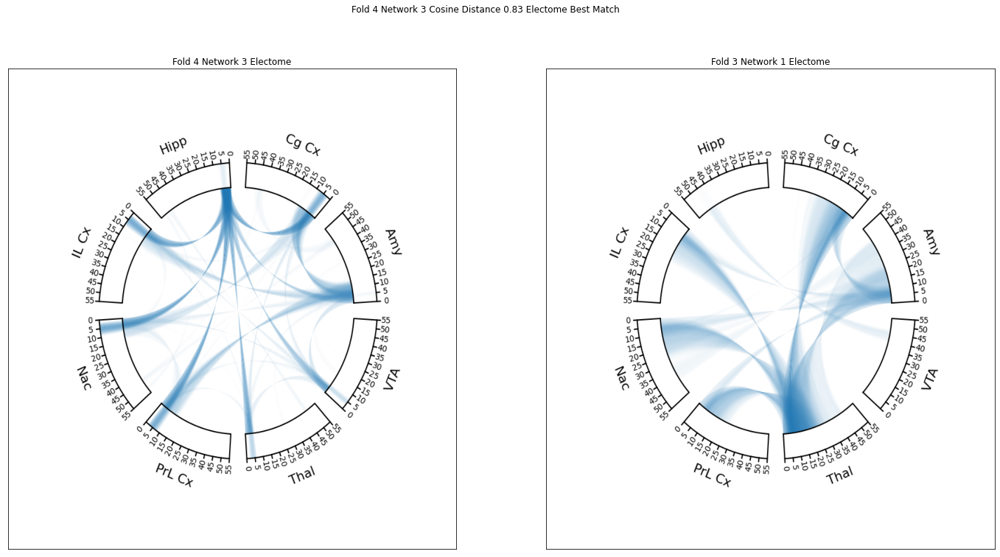

In [34]:
plots_file = plots_path + "bal_3_network_net_{}_30_component_kf_fold_{}_electome.png"
from scipy.optimize import linear_sum_assignment
from scipy.spatial.distance import cosine as cos_dis
import seaborn as sns

perc_cont_dict = {}

for fold in np.array(fold_list)-1:
    perc_cont_dict[fold] = np.vstack([net_1_list[fold-1],net_2_list[fold-1],net_3_list[fold-1]])

#use each fold as reference
for i in range(4):
    
    reference = np.array(perc_cont_dict[i])
    comp_keys = [key for key in list(perc_cont_dict.keys()) if key !=i]
    comp_1 = np.array(perc_cont_dict[comp_keys[0]])
    comp_2 = np.array(perc_cont_dict[comp_keys[1]])
    comp_3 = np.array(perc_cont_dict[comp_keys[2]])
    comparison = np.vstack([comp_1,comp_2,comp_3])
    
    cos_dis_mat = np.ones((3,9))
    for ref_net in range(reference.shape[0]):
        for comp_net in range(comparison.shape[0]):
            cos_dis_mat[ref_net,comp_net] = cos_dis(reference[ref_net],comparison[comp_net])
    
    row_idxs, col_idxs = linear_sum_assignment(cos_dis_mat)
    
    plt.figure(figsize=(40,10))
    
    plt.subplot(1,2,1)
    sns.heatmap(1-cos_dis_mat,annot=True,linewidth=0.5)
    plt.ylabel("Referencing Fold {}".format(i+1))
    plt.yticks([idx + .5 for idx in range(3)],
               ["Fold {} Net 1".format(i+1),
                "Fold {} Net 2".format(i+1),
                "Fold {} Net 3".format(i+1)])
    
    plt.xlabel("Comparing Fold {},{},{}".format(comp_keys[0]+1,comp_keys[1]+1,comp_keys[2]+1))
    plt.xticks([idx + .5 for idx in range(9)],
                     ["Fold {} Net 1".format(comp_keys[0]+1),
                      "Fold {} Net 2".format(comp_keys[0]+1),
                      "Fold {} Net 3".format(comp_keys[0]+1),
                      "Fold {} Net 1".format(comp_keys[1]+1),
                      "Fold {} Net 2".format(comp_keys[1]+1),
                      "Fold {} Net 3".format(comp_keys[1]+1),
                      "Fold {} Net 1".format(comp_keys[2]+1),
                      "Fold {} Net 2".format(comp_keys[2]+1),
                      "Fold {} Net 3".format(comp_keys[2]+1)]
                    )
    
                      
    plt.title("Cosine Similarity")
    
    plt.subplot(1,2,2)
    sel_mat = np.zeros_like(cos_dis_mat)
    sel_mat[row_idxs,col_idxs]=1
    sns.heatmap(sel_mat,annot=True,linewidth=0.5)
    plt.ylabel("Referencing Fold {}".format(i+1))
    plt.yticks([idx + .5 for idx in range(3)],
               ["Fold {} Net 1".format(i+1),
                "Fold {} Net 2".format(i+1),
                "Fold {} Net 3".format(i+1)])
    
    plt.xlabel("Comparing Fold {},{},{}".format(comp_keys[0]+1,comp_keys[1]+1,comp_keys[2]+1))
    plt.xticks([idx + .5 for idx in range(9)],
                     ["Fold {} Net 1".format(comp_keys[0]+1),
                      "Fold {} Net 2".format(comp_keys[0]+1),
                      "Fold {} Net 3".format(comp_keys[0]+1),
                      "Fold {} Net 1".format(comp_keys[1]+1),
                      "Fold {} Net 2".format(comp_keys[1]+1),
                      "Fold {} Net 3".format(comp_keys[1]+1),
                      "Fold {} Net 1".format(comp_keys[2]+1),
                      "Fold {} Net 2".format(comp_keys[2]+1),
                      "Fold {} Net 3".format(comp_keys[2]+1)]
                    )
    
                      
    plt.title("Chosen Match")
    plt.show()
    #Display the most similar networks
    for ref_net in range(reference.shape[0]):
        plt.figure(figsize=(24,12))
        close_net = col_idxs[ref_net]
        print("best match: {}<->{}".format(ref_net,close_net))
        plt.subplot(1,2,1)
        ref_im = image.imread(plots_file.format(ref_net+1,i+1))
        plt.imshow(ref_im,aspect="auto")
        plt.title("Fold {} Network {} Electome".format(i+1,ref_net+1))
        plt.xticks([])
        plt.yticks([])
        
        plt.subplot(1,2,2)
        if close_net < 3:
            comp_im = image.imread(plots_file.format(close_net+1,comp_keys[0]+1))
            plt.title("Fold {} Network {} Electome".format(comp_keys[0]+1,close_net+1))
        elif (close_net >=3) and (close_net < 6):
            comp_im = image.imread(plots_file.format(close_net-3+1,comp_keys[1]+1))
            plt.title("Fold {} Network {} Electome".format(comp_keys[1]+1,close_net-3+1))
        else:
            comp_im = image.imread(plots_file.format(close_net-6+1,comp_keys[1]+1))
            plt.title("Fold {} Network {} Electome".format(comp_keys[2]+1,close_net-6+1))
       
        plt.imshow(comp_im,aspect="auto")
        plt.xticks([])
        plt.yticks([])
        
        plt.suptitle("Fold {} Network {} Cosine Distance {:.2f} Electome Best Match".format(i+1,ref_net+1,cos_dis_mat[ref_net,close_net]))
        plt.show()

## 3 to 1 Network

Here we train the model to learn 3 networks to predict a single behavioral label in a multivariate logistic regression. We do the same network matching analysis as above.

In [24]:
results_file = results_path + "rebal_321_net_{}_results.pkl"
plots_file = plots_path + "bal_321_network_net_{}_30_component_kf_fold_{}_electome.png"

fold_list = [1,3,4]

flx_auc_list = []
epm_auc_list = []
oft_auc_list = []

flx_sterr_list = []
epm_sterr_list = []
oft_sterr_list = []

flx_points_list = []
epm_points_list = []
oft_points_list = []

net_1_list = []
net_2_list = []
net_3_list = []
    
for fold in fold_list:
    
    resultsDict = pickle.load(open(results_file.format(fold),"rb"))
    print(fold)
    
    flx_mean, flx_sterr, flx_n = mean_sterr_auc(resultsDict['flx_val_auc'])
    print("FLX",flx_mean, flx_sterr, flx_n)
    flx_auc_list.append(flx_mean)
    flx_sterr_list.append(flx_sterr)
    flx_points_list.append([resultsDict['flx_val_auc'][key] for key in resultsDict['flx_val_auc'].keys()])

    epm_mean, epm_sterr, epm_n = mean_sterr_auc(resultsDict['epm_val_auc'])
    print("EPM",epm_mean, epm_sterr, epm_n)
    epm_auc_list.append(epm_mean)
    epm_sterr_list.append(epm_sterr)
    epm_points_list.append([resultsDict['epm_val_auc'][key] for key in resultsDict['epm_val_auc'].keys()])
  
    oft_mean, oft_sterr, oft_n = mean_sterr_auc(resultsDict['oft_val_auc'])
    print("OFT",oft_mean, oft_sterr, oft_n)
    oft_auc_list.append(oft_mean)
    oft_sterr_list.append(oft_sterr)
    oft_points_list.append([resultsDict['oft_val_auc'][key] for key in resultsDict['oft_val_auc'].keys()])

    net_1_list.append(resultsDict['recon_cont_net_1'])
    net_2_list.append(resultsDict['recon_cont_net_2'])
    net_3_list.append(resultsDict['recon_cont_net_3'])
    print(resultsDict["best_epoch"])

1
FLX 0.70458011194205 0.0763484584458378 3
EPM 0.5356387110367244 0.053943425858365764 7
OFT 0.6449561438386128 0.08423029942065997 3
382
3
FLX 0.6432020384210191 0.000999303290958972 2
EPM 0.5364968967107415 0.017998922044112502 6
OFT 0.668383436360596 0.030377685582196473 4
1938
4
FLX 0.6051796831897802 0.007386081176521635 2
EPM 0.5635255078514428 0.03189776797014615 6
OFT 0.6431267980256264 0.026384898000990822 3
1990


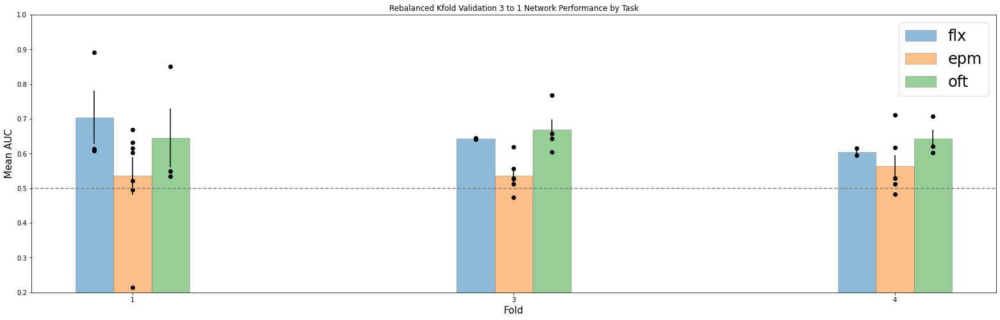

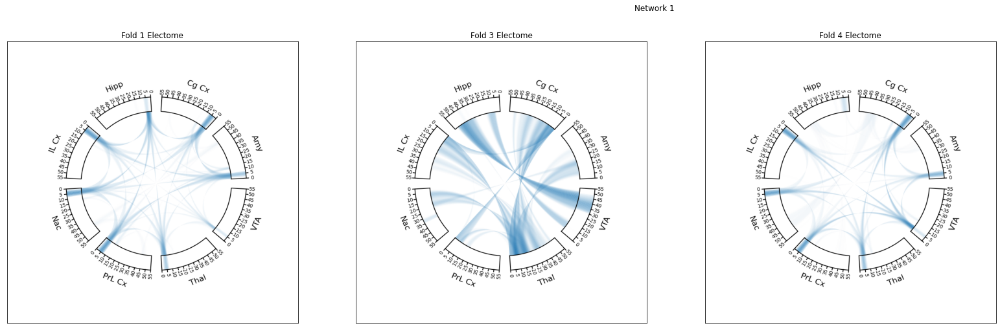

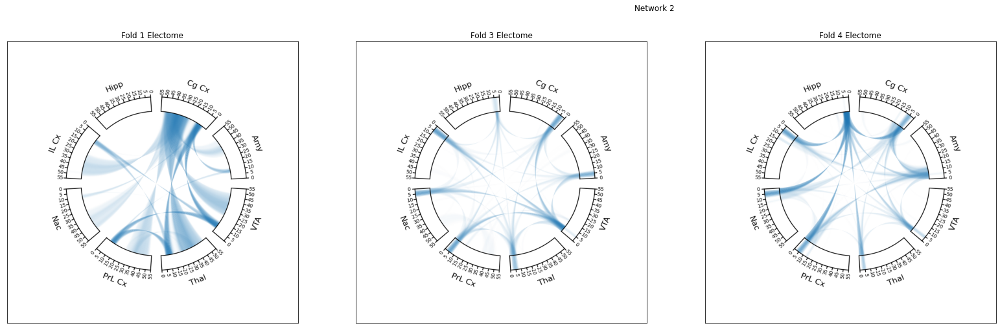

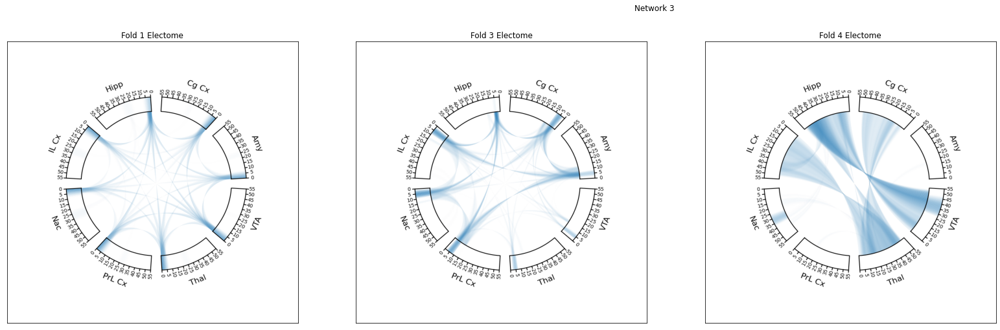

In [25]:
barWidth = 0.1
fig = plt.subplots(figsize=(27,8))

br1 = np.arange(len(flx_auc_list))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]

# Make the plot
plt.bar(br1, flx_auc_list,yerr=flx_sterr_list, width = barWidth,
        edgecolor ='grey', label ='flx',alpha=0.5)
plt.bar(br2, epm_auc_list,yerr=epm_sterr_list, width = barWidth,
        edgecolor ='grey', label ='epm',alpha=0.5)
plt.bar(br3, oft_auc_list,yerr=oft_sterr_list, width = barWidth,
        edgecolor ='grey', label ='oft',alpha=0.5)

for fold in range(len(fold_list)):
    plt.scatter(np.ones(len(flx_points_list[fold]))*br1[fold],flx_points_list[fold],color="black")
    plt.scatter(np.ones(len(epm_points_list[fold]))*br2[fold],epm_points_list[fold],color="black")
    plt.scatter(np.ones(len(oft_points_list[fold]))*br3[fold],oft_points_list[fold],color="black")

# Adding Xticks
plt.axhline(0.5,-1,6,linestyle="dashed",color="grey")
plt.xlabel('Fold', fontsize = 15)
plt.ylabel('Mean AUC', fontsize = 15)
plt.xticks([r + barWidth for r in range(len(flx_auc_list))],
        fold_list)
plt.ylim([0.2,1])
plt.legend(prop={'size':24})
plt.title("Rebalanced Kfold Validation 3 to 1 Network Performance by Task")
plt.show()

for net in [1,2,3]:
    plt.figure(figsize=(37,8))
    
    for i,fold in enumerate(fold_list):
        plt.subplot(1,4,i+1)
        im = image.imread(plots_file.format(net,fold))
        plt.imshow(im,aspect="auto")
        plt.title("Fold {} Electome".format(fold))
        plt.xticks([])
        plt.yticks([])
    plt.suptitle("Network {}".format(net))
    plt.show()

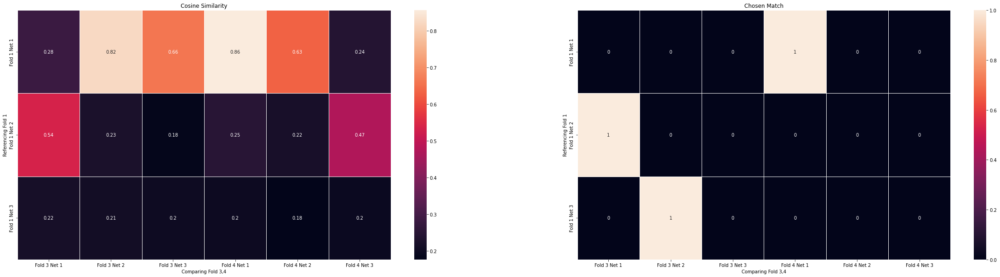

best match: 0<->3


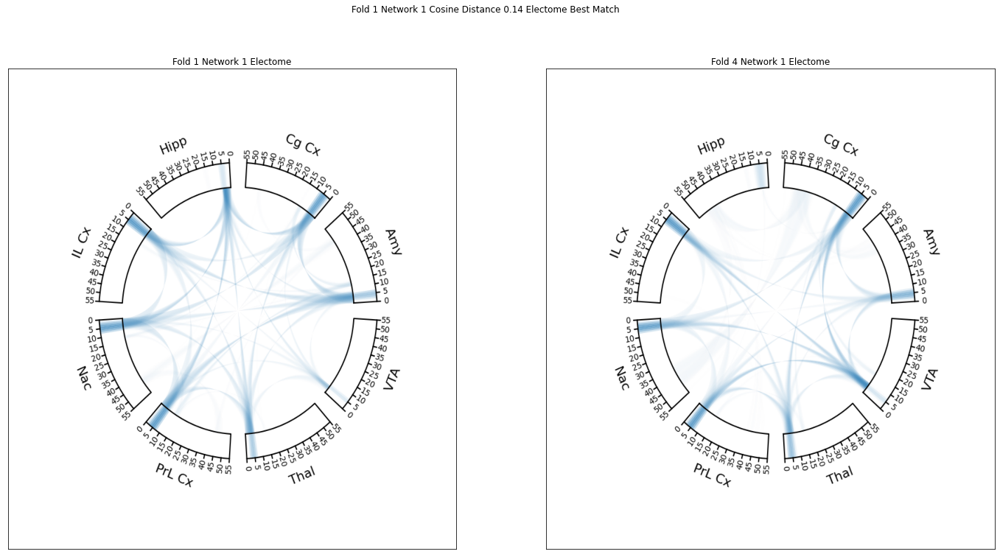

best match: 1<->0


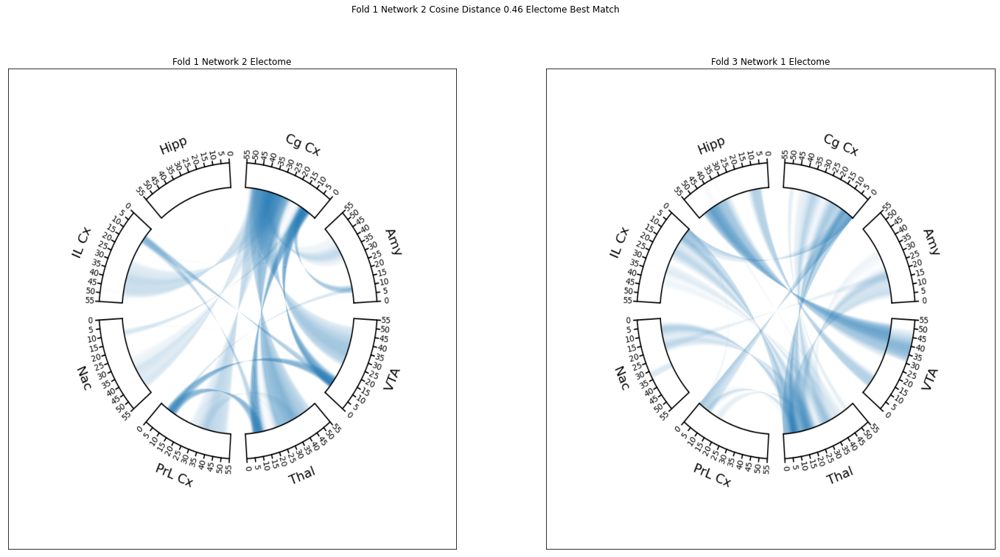

best match: 2<->1


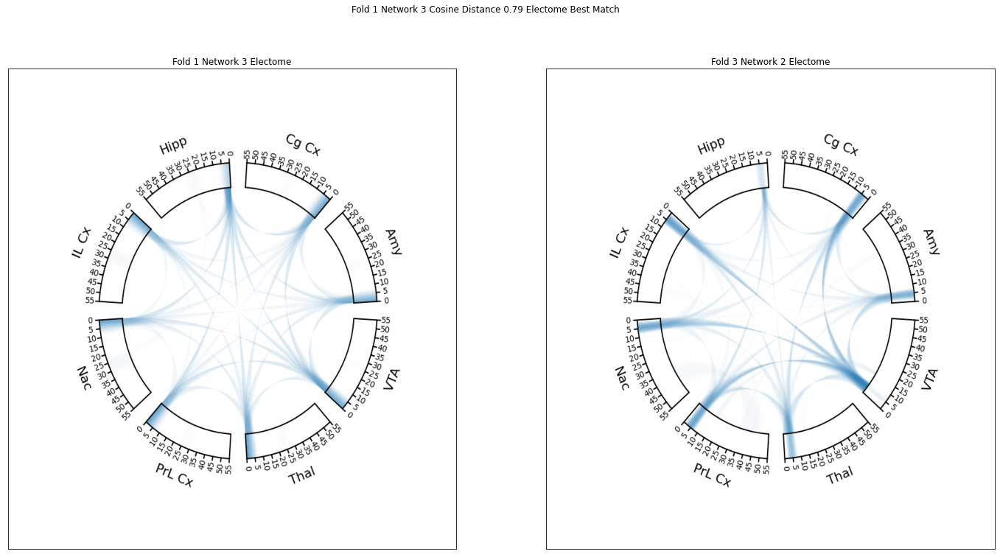

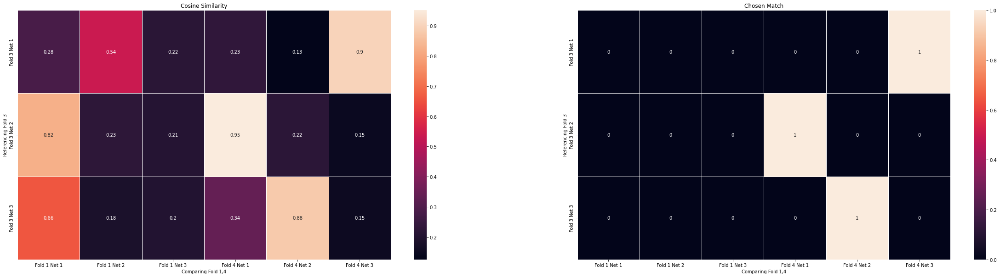

best match: 0<->5


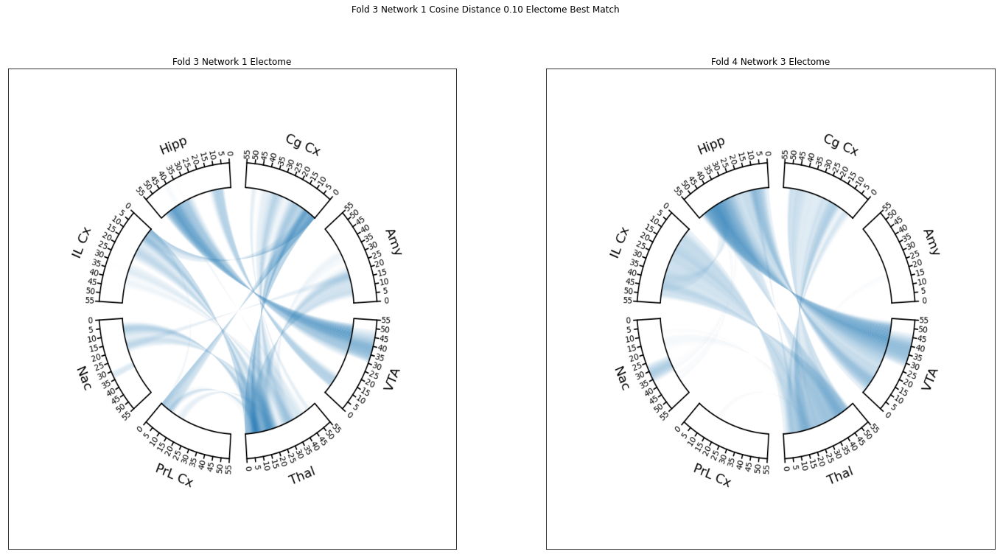

best match: 1<->3


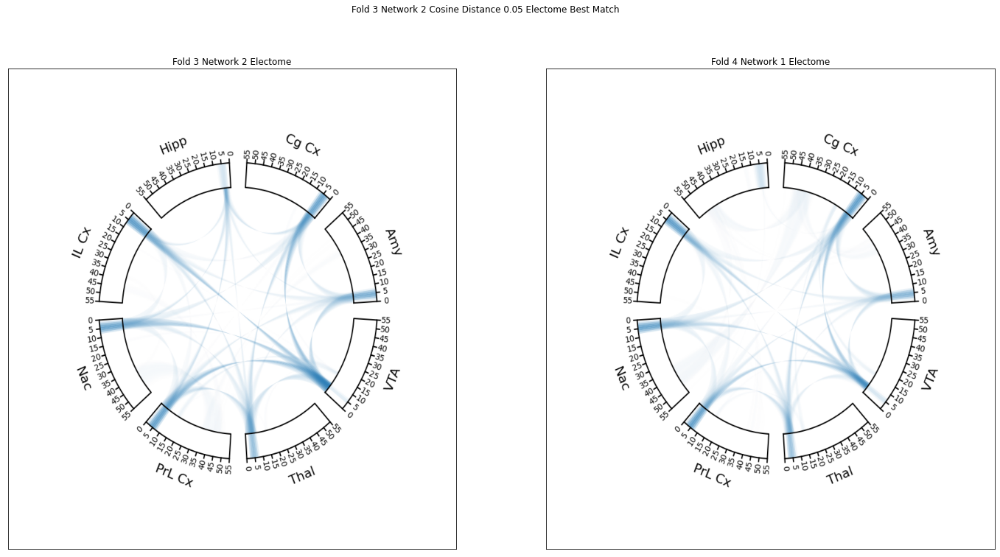

best match: 2<->4


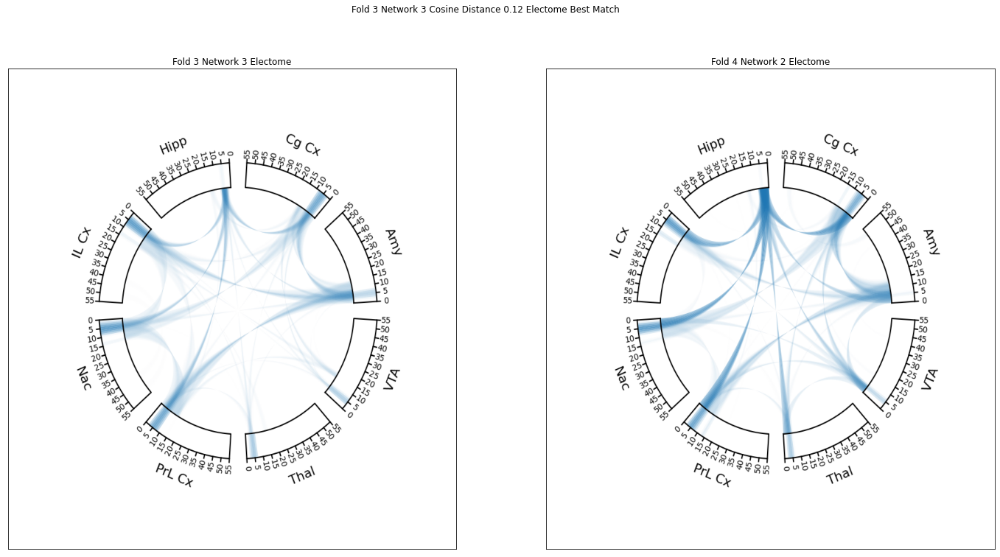

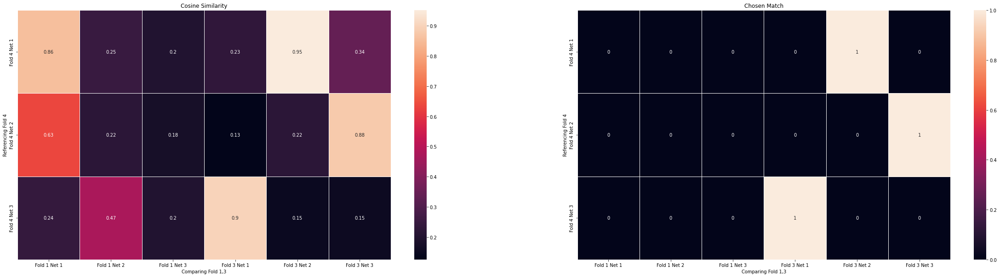

best match: 0<->4


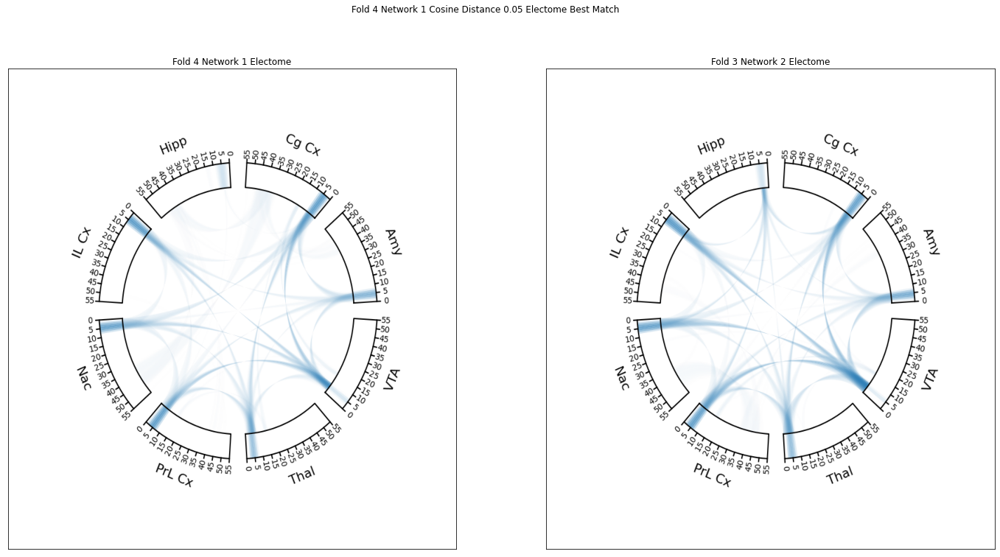

best match: 1<->5


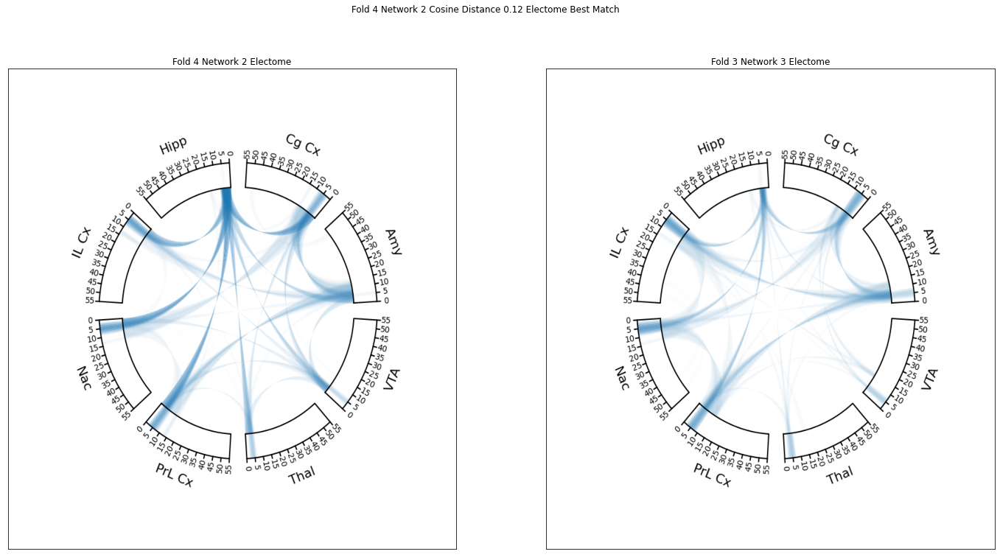

best match: 2<->3


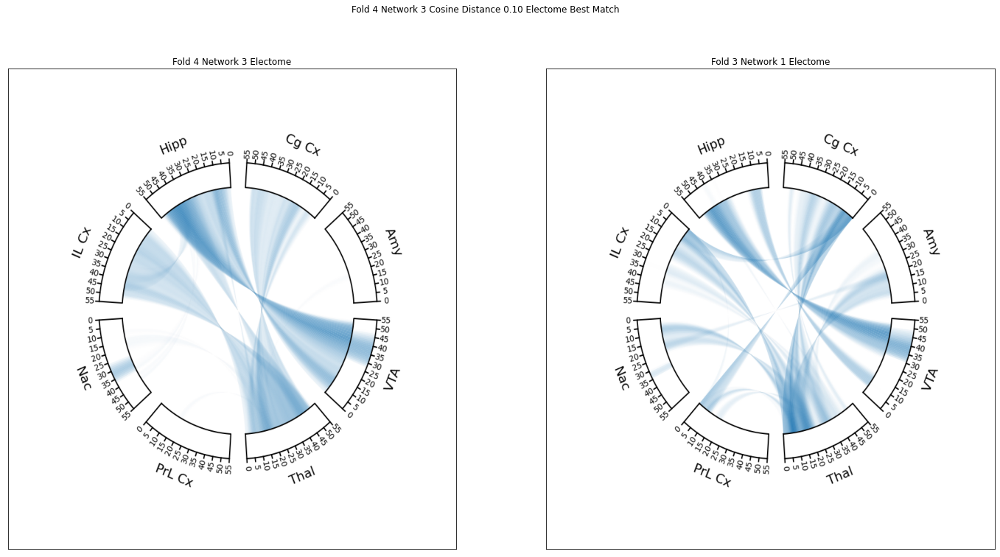

In [30]:
from scipy.optimize import linear_sum_assignment
from scipy.spatial.distance import cosine as cos_dis
plots_file = plots_path + "bal_321_network_net_{}_30_component_kf_fold_{}_electome.png"

perc_cont_dict = {}

for idx,fold in enumerate(np.array(fold_list)-1):
    perc_cont_dict[fold] = np.vstack([net_1_list[idx],net_2_list[idx],net_3_list[idx]])

#use each fold as reference
for i in np.array(fold_list)-1:
    
    reference = np.array(perc_cont_dict[i])
    comp_keys = [key for key in list(perc_cont_dict.keys()) if key !=i]
    comp_1 = np.array(perc_cont_dict[comp_keys[0]])
    comp_2 = np.array(perc_cont_dict[comp_keys[1]])
    comparison = np.vstack([comp_1,comp_2])
    
    cos_dis_mat = np.ones((3,6))
    for ref_net in range(reference.shape[0]):
        for comp_net in range(comparison.shape[0]):
            cos_dis_mat[ref_net,comp_net] = cos_dis(reference[ref_net],comparison[comp_net])
    
    row_idxs, col_idxs = linear_sum_assignment(cos_dis_mat)
    
    plt.figure(figsize=(40,10))
    
    plt.subplot(1,2,1)
    sns.heatmap(1-cos_dis_mat,annot=True,linewidth=0.5)
    plt.ylabel("Referencing Fold {}".format(i+1))
    plt.yticks([idx + .5 for idx in range(3)],
               ["Fold {} Net 1".format(i+1),
                "Fold {} Net 2".format(i+1),
                "Fold {} Net 3".format(i+1)])
    
    plt.xlabel("Comparing Fold {},{}".format(comp_keys[0]+1,comp_keys[1]+1))
    plt.xticks([idx + .5 for idx in range(6)],
                     ["Fold {} Net 1".format(comp_keys[0]+1),
                      "Fold {} Net 2".format(comp_keys[0]+1),
                      "Fold {} Net 3".format(comp_keys[0]+1),
                      "Fold {} Net 1".format(comp_keys[1]+1),
                      "Fold {} Net 2".format(comp_keys[1]+1),
                      "Fold {} Net 3".format(comp_keys[1]+1)]
                    )
    
                      
    plt.title("Cosine Similarity")
    
    plt.subplot(1,2,2)
    sel_mat = np.zeros_like(cos_dis_mat)
    sel_mat[row_idxs,col_idxs]=1
    sns.heatmap(sel_mat,annot=True,linewidth=0.5)
    plt.ylabel("Referencing Fold {}".format(i+1))
    plt.yticks([idx + .5 for idx in range(3)],
               ["Fold {} Net 1".format(i+1),
                "Fold {} Net 2".format(i+1),
                "Fold {} Net 3".format(i+1)])
    
    plt.xlabel("Comparing Fold {},{}".format(comp_keys[0]+1,comp_keys[1]+1))
    plt.xticks([idx + .5 for idx in range(6)],
                     ["Fold {} Net 1".format(comp_keys[0]+1),
                      "Fold {} Net 2".format(comp_keys[0]+1),
                      "Fold {} Net 3".format(comp_keys[0]+1),
                      "Fold {} Net 1".format(comp_keys[1]+1),
                      "Fold {} Net 2".format(comp_keys[1]+1),
                      "Fold {} Net 3".format(comp_keys[1]+1)]
                    )
    
                      
    plt.title("Chosen Match")
    plt.show()
    #Display the most similar networks
    for ref_net in range(reference.shape[0]):
        plt.figure(figsize=(24,12))
        close_net = col_idxs[ref_net]
        print("best match: {}<->{}".format(ref_net,close_net))
        plt.subplot(1,2,1)
        ref_im = image.imread(plots_file.format(ref_net+1,i+1))
        plt.imshow(ref_im,aspect="auto")
        plt.title("Fold {} Network {} Electome".format(i+1,ref_net+1))
        plt.xticks([])
        plt.yticks([])
        
        plt.subplot(1,2,2)
        if close_net < 3:
            comp_im = image.imread(plots_file.format(close_net+1,comp_keys[0]+1))
            plt.title("Fold {} Network {} Electome".format(comp_keys[0]+1,close_net+1))
        elif (close_net >=3) and (close_net < 6):
            comp_im = image.imread(plots_file.format(close_net-3+1,comp_keys[1]+1))
            plt.title("Fold {} Network {} Electome".format(comp_keys[1]+1,close_net-3+1))
        else:
            comp_im = image.imread(plots_file.format(close_net-6+1,comp_keys[1]+1))
            plt.title("Fold {} Network {} Electome".format(comp_keys[2]+1,close_net-6+1))
       
        plt.imshow(comp_im,aspect="auto")
        plt.xticks([])
        plt.yticks([])
        
        plt.suptitle("Fold {} Network {} Cosine Distance {:.2f} Electome Best Match".format(i+1,ref_net+1,cos_dis_mat[ref_net,close_net]))
        plt.show()